# Dog face detection in images with YOLOv8 and Ultralytics

## 1. Installing Dependencies

The `ultralytics` library provides implementations of YOLOv8 models, which are suitable for object detection tasks in images and videos. This model is optimized to offer a good balance between accuracy and speed, making it ideal for real-time detection or analyzing large volumes of images. You can find more information about this model in the [official Ultralytics documentation](https://github.com/ultralytics/ultralytics).


In [1]:
%pip install ultralytics --quiet

Note: you may need to restart the kernel to use updated packages.


## 2. Import Necessary Libraries

We import the necessary libraries for the project, which will allow us to access the functions and classes we will use.

In [2]:
# Import necessary libraries
import os
import glob
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import ultralytics
import yaml
import shutil
from tqdm import tqdm
from pathlib import Path
from ultralytics import YOLO

# Ensure that images display correctly in the notebook
%matplotlib inline

os.environ['WANDB_MODE'] = 'disabled'

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
# Verify that the environment is set up correctly for YOLOv8
ultralytics.checks()

Ultralytics 8.3.9 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5933.9/8062.4 GB disk)


## 3. Preparing the Dataset

We will define the directory structure for our dataset and copy the necessary data into these directories. This setup organizes the training and validation images and labels in a way that is compatible with the YOLOv8 model.

In [4]:
# Define the dataset directory structure
dataset_dirs = {
    'train_images': '/kaggle/working/dataset/images/train',
    'val_images': '/kaggle/working/dataset/images/val',
    'train_labels': '/kaggle/working/dataset/labels/train',
    'val_labels': '/kaggle/working/dataset/labels/val'
}

# Create directories if they do not exist
for dir_path in dataset_dirs.values():
    Path(dir_path).mkdir(parents=True, exist_ok=True)

We define a function to copy data from the input directories to the dataset directories:

In [5]:
# Copy data from input directory to the dataset directories
def copy_data(src_pattern: str, dest_dir: str):
    """
    Copies files from the source pattern to the destination directory.

    Args:
    src_pattern (str): Pattern matching the source files (e.g., using glob).
    dest_dir (str): Destination directory where the files will be copied.
    """
    for file_path in glob.glob(src_pattern):
        shutil.copy(file_path, dest_dir)

Now, we use this function to copy the training and validation images and labels:

In [6]:
# Copy training and validation images and labels
copy_data('/kaggle/input/dog-face-detectionyolo-format/train_img/*', dataset_dirs['train_images'])
copy_data('/kaggle/input/dog-face-detectionyolo-format/train_label/*', dataset_dirs['train_labels'])
copy_data('/kaggle/input/dog-face-detectionyolo-format/val_img/*', dataset_dirs['val_images'])
copy_data('/kaggle/input/dog-face-detectionyolo-format/val_label/*', dataset_dirs['val_labels'])

Next, we define the dataset paths for the training and validation sets and print the dataset structure for verification:

In [7]:
# Define dataset paths for training and validation sets
train_img_dir = dataset_dirs['train_images']
train_label_dir = dataset_dirs['train_labels']
val_img_dir = dataset_dirs['val_images']
val_label_dir = dataset_dirs['val_labels']

# Print if path exists
print("Train images exist:", os.path.exists(train_img_dir))
print("Train labels exist:", os.path.exists(train_label_dir))
print("Validation images exist:", os.path.exists(val_img_dir))
print("Validation labels exist:", os.path.exists(val_label_dir))

Train images exist: True
Train labels exist: True
Validation images exist: True
Validation labels exist: True


We define a function to plot images with bounding boxes to visualize the dataset:

In [8]:
def plot_images_with_boxes(image_paths: list[str], label_paths: list[str]) -> None:
    """
    This function takes a list of image file paths and corresponding YOLO label file paths,
    resizes all images to match the smallest image in the set, and displays them in a 3-column grid 
    with bounding boxes drawn based on the provided labels.

    Parameters:
    -----------
    image_paths : list of str
        List of file paths for the images to be displayed.

    label_paths : list of str
        List of file paths for the corresponding YOLO format label files. Each label file should 
        have the same name as the image file but with a .txt extension.

    Returns:
    --------
    None
    """

    # Initialize variables to track the minimum width and height among all images
    min_height, min_width = np.inf, np.inf

    # Lists to store loaded images and their corresponding labels
    images = []
    labels = []

    # Iterate through the image paths to read each image and its corresponding label file
    for img_path, label_path in zip(image_paths, label_paths):
        # Load the image using OpenCV and convert it from BGR to RGB format (as matplotlib uses RGB)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Get the dimensions of the image
        height, width, _ = img.shape

        # Update the minimum height and width if the current image is smaller
        if height < min_height:
            min_height = height
        if width < min_width:
            min_width = width

        # Append the image to the images list
        images.append(img)

        # Read the corresponding label file and store the bounding box information
        with open(label_path, 'r') as f:
            labels.append(f.readlines())

    # Define the minimum size to which all images will be resized
    min_size = (min_width, min_height)

    # Calculate the number of rows required for the grid (3 images per row)
    fig, axes = plt.subplots(nrows=(len(images) + 2) // 3, ncols=3, figsize=(15, 10))

    # Iterate through each image and its corresponding labels
    for i, (img, boxes) in enumerate(zip(images, labels)):
        # Resize the image to the minimum size
        img = cv2.resize(img, min_size)
        height, width, _ = img.shape

        # Draw the bounding boxes on the image
        for box in boxes:
            # Parse the YOLO format: class, x_center, y_center, width, height
            cls, x_center, y_center, w, h = map(float, box.strip().split())

            # Convert the normalized coordinates back to pixel coordinates
            x_center *= width
            y_center *= height
            w *= width
            h *= height

            # Calculate the top-left and bottom-right coordinates of the bounding box
            x1 = int(x_center - w / 2)
            y1 = int(y_center - h / 2)
            x2 = int(x_center + w / 2)
            y2 = int(y_center + h / 2)

            # Draw the bounding box on the image with a blue rectangle
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

        # Determine the correct subplot axis for the current image and display it
        ax = axes[i // 3, i % 3]
        ax.imshow(img)
        ax.axis('off')  # Hide the axis for a cleaner look

    # Hide any remaining unused subplots if the total number of images isn't a multiple of 3
    for j in range(i + 1, len(axes.flatten())):
        axes.flatten()[j].axis('off')

    # Adjust the layout to prevent overlap and ensure the grid looks tidy
    plt.tight_layout()
    plt.show()

Finally, we sample some images and use the function to visualize them with bounding boxes.

This will display a grid of images from the training set with their corresponding bounding boxes, allowing us to verify that the dataset has been prepared correctly.

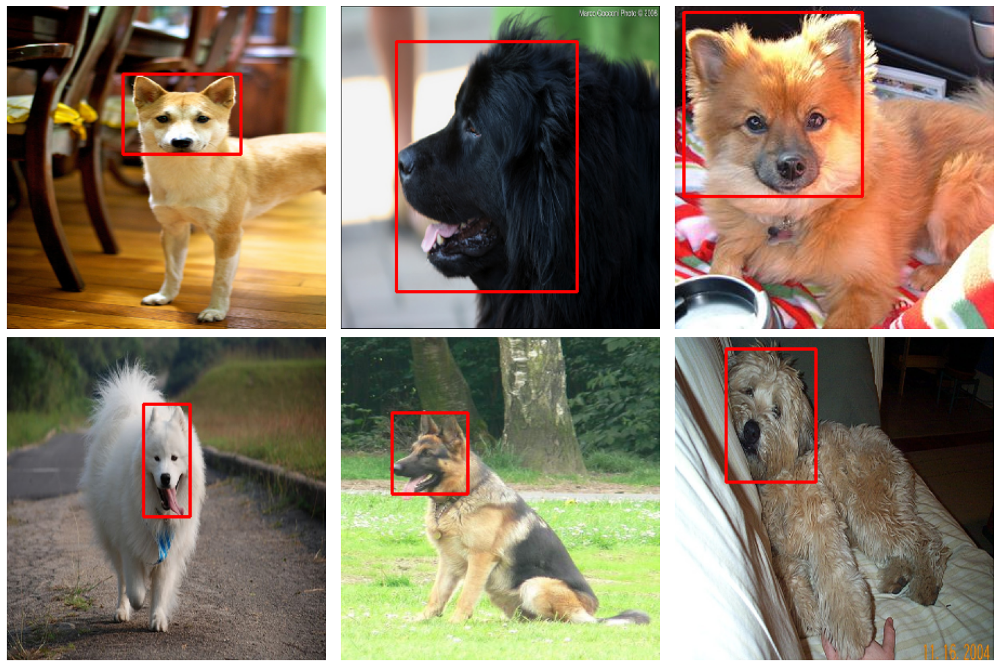

In [9]:
sample_images = glob.glob(os.path.join(train_img_dir, '*.jpg'))[:6]
sample_labels = [os.path.join(train_label_dir, os.path.basename(img).replace('.jpg', '.txt')) for img in sample_images]
plot_images_with_boxes(sample_images, sample_labels)

## 4. Creation of the Dataset Configuration File

To train the YOLOv8 model using Ultralytics, we need a configuration file that describes where the training and validation images and labels are located, the number of classes, and the class names. This file is essential for the training process as it helps the model understand the dataset structure.

The YAML configuration file is saved as `dog_face_detection.yaml` and contains the following information:
- **train**: Path to the training images.
- **val**: Path to the validation images.
- **nc**: Number of classes (in this case, 1 class: dog faces).
- **names**: List of class names (in this case, just "dog_face").

Once this file is created, we can proceed with training the model.

In [10]:
data_yaml = {
    'train': train_img_dir,
    'val': val_img_dir,
    'nc': 1,  # Number of classes
    'names': ['dog_face']  # Name of the class
}

# Write the configuration to a YAML file
dog_face_detection = 'dog_face_detection.yaml'

try:
    with open(dog_face_detection, 'w') as yaml_file:
        yaml.dump(data_yaml, yaml_file, default_flow_style=False)
    print(f"YAML configuration saved successfully at {dog_face_detection}")
except Exception as e:
    print(f"Error writing YAML file: {e}")

# Optional: Display the content of the YAML file for verification
with open(dog_face_detection, 'r') as yaml_file:
    print("YAML file content:")
    print(yaml_file.read())

YAML configuration saved successfully at dog_face_detection.yaml
YAML file content:
names:
- dog_face
nc: 1
train: /kaggle/working/dataset/images/train
val: /kaggle/working/dataset/images/val



## 5. Model Selection and Configuration

In this step, we load a pre-trained YOLOv8 model from the Ultralytics library. Using a pre-trained model allows us to leverage transfer learning, which means the model already has some knowledge from training on large datasets like COCO. This enables the model to adapt more quickly and efficiently to our custom dataset of dog faces.

After training, the model checkpoints and results will be saved, and the training logs will provide insight into the model’s performance.

By adjusting the parameters (e.g., using a larger YOLOv8 model or more epochs), we can further fine-tune the performance.


In [11]:
# Load a pre-trained YOLOv8 model from Ultralytics
model = YOLO('yolov8n.pt')  # 'n' stands for nano version, can be replaced by other versions (e.g., yolov8s, yolov8m)

# Print model details for verification
print("Model successfully loaded:")
model.info()  # This prints a summary of the model architecture and parameters

100%|██████████| 6.25M/6.25M [00:00<00:00, 80.4MB/s]


Model successfully loaded:
YOLOv8n summary: 225 layers, 3,157,200 parameters, 0 gradients, 8.9 GFLOPs


(225, 3157200, 0, 8.8575488)

In [ ]:
# Train the model on the custom dataset
results = model.train(data=dog_face_detection, epochs=20, patience=5,
                        batch=0.8, imgsz=640, cache=True,
                        project = 'dog_face_detection',
                        optimizer = 'auto', seed = 42,
                        amp= False, val = True,
                        plots = True, augment=True, verbose = False)

# Display training results
print("Training complete. Model results:")
print(results)

## 6. Model Evaluation

Once the model has been trained, it is important to evaluate its performance on the validation dataset to understand how well it generalizes to unseen data.

### Evaluation
We use the validation set to calculate performance metrics such as:
- **Precision**: The percentage of correctly identified dog faces out of all detections.
- **Recall**: The percentage of actual dog faces that were correctly detected.
- **mAP (mean Average Precision)**: A combined metric that summarizes the model’s accuracy at different thresholds.

In [13]:
# Evaluate the model on the validation set
metrics = model.val()

Ultralytics 8.3.9 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 186 layers, 2,684,563 parameters, 0 gradients, 6.8 GFLOPs


val: Scanning /kaggle/working/dataset/labels/val.cache... 230 images, 0 backgrounds, 0 corrupt: 100%|██████████| 230/230 [00:00<?, ?it/s]

WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.



val: Caching images (0.2GB RAM): 100%|██████████| 230/230 [00:00<00:00, 886.14it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.68it/s]


                   all        230        244      0.964      0.975      0.992      0.738
Speed: 0.2ms preprocess, 9.9ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to dog_face_detection/train2


In [14]:
# Print evaluation metrics
print("Model evaluation metrics:")
print(f"mAP50-95: {metrics.box.map:.4f}")
print(f"mAP75: {metrics.box.map75:.4f}")
print(f"mAP50: {metrics.box.map50:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}")

Model evaluation metrics:
mAP50-95: 0.7375
mAP75: 0.8691
mAP50: 0.9918
Precision: 0.9635
Recall: 0.9750


## 7. Hyperparameter Optimization

We use the `tune` function to find the best hyperparameters for our model. Hyperparameter tuning is crucial as it can significantly improve the model's performance by finding the optimal set of parameters for training.

In [15]:
# Perform hyperparameter tuning
model.tune(
    data=dog_face_detection,      # Path to the dataset configuration file
    epochs=20,                    # Maximum number of epochs to train
    patience=5,                   # Early stopping patience
    batch=0.8,                    # Batch size as a fraction of dataset size
    imgsz=640,                    # Input image size
    cache=True,                   # Cache images for faster training
    project='dog_face_detection_tuning',  # Project name for saving outputs
    optimizer='auto',             # Automatically select the optimizer
    seed=42,                      # Seed for reproducibility
    amp=False,                    # Disable Automatic Mixed Precision
    val=True,                     # Evaluate validation set during training
    plots=True,                   # Generate plots during tuning
    iterations=3,                 # Number of tuning iterations
    augment=True                  # Apply data augmentation
)

Tuner: Initialized Tuner instance with 'tune_dir=dog_face_detection_tuning/tune'
Tuner: 💡 Learn about tuning at https://docs.ultralytics.com/guides/hyperparameter-tuning
Tuner: Starting iteration 1/3 with hyperparameters: {'lr0': 0.01, 'lrf': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'box': 7.5, 'cls': 0.5, 'dfl': 1.5, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.1, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'bgr': 0.0, 'mosaic': 1.0, 'mixup': 0.0, 'copy_paste': 0.0}
Ultralytics 8.3.9 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=dog_face_detection.yaml, epochs=20, time=None, patience=5, batch=0.8, imgsz=640, save=True, save_period=-1, cache=True, device=None, workers=8, project=dog_face_detection_tuning, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=False, seed=42, determi

train: Scanning /kaggle/working/dataset/labels/train.cache... 5924 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5924/5924 [00:00<?, ?it/s]
  0%|          | 0/5924 [00:00<?, ?it/s]

WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (5.0GB RAM): 100%|██████████| 5924/5924 [00:07<00:00, 807.23it/s]
/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/dataset/labels/val.cache... 230 images, 0 backgrounds, 0 corrupt: 100%|██████████| 230/230 [00:00<?, ?it/s]
  0%|          | 0/230 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.2GB RAM): 100%|██████████| 230/230 [00:00<00:00, 466.97it/s]


Plotting labels to dog_face_detection_tuning/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0003515625), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to dog_face_detection_tuning/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      10.5G      1.037      1.574       1.25         73        640: 100%|██████████| 132/132 [01:35<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.23it/s]


                   all        230        244      0.833      0.736      0.826      0.453

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      10.5G      1.068     0.9107      1.233         65        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


                   all        230        244      0.583      0.369      0.416       0.19

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      10.5G      1.102     0.7817       1.25         55        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]


                   all        230        244      0.691      0.648      0.711      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      10.5G      1.068     0.7019      1.227         66        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]


                   all        230        244      0.757      0.607      0.705      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      10.5G      1.002     0.6314       1.18         61        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]


                   all        230        244      0.595      0.492      0.493      0.269

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      10.5G     0.9431     0.5822      1.151         70        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]


                   all        230        244      0.932      0.899      0.937      0.567

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      10.5G     0.8878      0.537      1.123         57        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]


                   all        230        244      0.906      0.803      0.915      0.533

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      10.5G     0.8573     0.5156       1.11         61        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]


                   all        230        244      0.878      0.934      0.951      0.582

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      10.5G     0.8281     0.4938       1.09         70        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]


                   all        230        244      0.918      0.877      0.941      0.584

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      10.5G     0.7923     0.4687      1.078         60        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]


                   all        230        244       0.91      0.922      0.969      0.598
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      10.5G      1.111     0.5745      1.292         29        640: 100%|██████████| 132/132 [01:34<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.929      0.965      0.979      0.644

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      10.5G      1.045     0.5276      1.253         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.934      0.975      0.985      0.653

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      10.5G      1.015     0.5001      1.227         30        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]


                   all        230        244      0.962      0.932      0.981      0.652

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      10.5G     0.9809     0.4779      1.197         30        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


                   all        230        244      0.954      0.984      0.988      0.689

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      10.5G     0.9511     0.4542      1.183         30        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


                   all        230        244      0.948      0.988       0.99      0.698

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      10.5G     0.9227     0.4289      1.157         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]


                   all        230        244      0.956      0.978      0.986      0.696

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      10.5G     0.8977     0.4081      1.144         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.975      0.962      0.988      0.705

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      10.5G     0.8703     0.3949      1.123         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]


                   all        230        244      0.975      0.975      0.992      0.703

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      10.5G     0.8467     0.3754      1.114         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]


                   all        230        244      0.979      0.979      0.992      0.719

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      10.5G     0.8201     0.3554      1.093         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]


                   all        230        244      0.967      0.984      0.992      0.729

20 epochs completed in 0.537 hours.
Optimizer stripped from dog_face_detection_tuning/train/weights/last.pt, 5.6MB
Optimizer stripped from dog_face_detection_tuning/train/weights/best.pt, 5.6MB

Validating dog_face_detection_tuning/train/weights/best.pt...
Ultralytics 8.3.9 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 186 layers, 2,684,563 parameters, 0 gradients, 6.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.07s/it]


                   all        230        244      0.949      0.985       0.99       0.72
Speed: 0.2ms preprocess, 10.3ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to dog_face_detection_tuning/train
💡 Learn more at https://docs.ultralytics.com/modes/train
Saved dog_face_detection_tuning/tune/tune_scatter_plots.png
Saved dog_face_detection_tuning/tune/tune_fitness.png

Tuner: 1/3 iterations complete ✅ (1978.05s)
Tuner: Results saved to dog_face_detection_tuning/tune
Tuner: Best fitness=0.75557 observed at iteration 1
Tuner: Best fitness metrics are {'metrics/precision(B)': 0.96658, 'metrics/recall(B)': 0.98361, 'metrics/mAP50(B)': 0.99221, 'metrics/mAP50-95(B)': 0.72928, 'val/box_loss': 1.0665, 'val/cls_loss': 0.37876, 'val/dfl_loss': 1.22832, 'fitness': 0.75557}
Tuner: Best fitness model is dog_face_detection_tuning/train
Tuner: Best fitness hyperparameters are printed below.

Printing 'dog_face_detection_tuning/tune/best_hyperparameters.yaml'

lr0: 0.01
lrf: 0.01

train: Scanning /kaggle/working/dataset/labels/train.cache... 5924 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5924/5924 [00:00<?, ?it/s]
  0%|          | 0/5924 [00:00<?, ?it/s]

WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (5.0GB RAM): 100%|██████████| 5924/5924 [00:07<00:00, 795.24it/s]
/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/dataset/labels/val.cache... 230 images, 0 backgrounds, 0 corrupt: 100%|██████████| 230/230 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.2GB RAM): 100%|██████████| 230/230 [00:00<00:00, 463.08it/s]


Plotting labels to dog_face_detection_tuning/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00971' and 'momentum=0.93931' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.00035859375), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to dog_face_detection_tuning/train2
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      10.5G      1.065      1.555      1.271         72        640: 100%|██████████| 132/132 [01:35<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.20it/s]


                   all        230        244      0.814      0.628      0.739      0.394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      10.5G      1.093     0.8874      1.245         65        640: 100%|██████████| 132/132 [01:34<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]


                   all        230        244      0.677      0.598       0.64      0.303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      10.5G      1.143      0.773       1.27         56        640: 100%|██████████| 132/132 [01:34<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.73it/s]


                   all        230        244      0.357       0.51      0.339      0.142

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      10.5G      1.097     0.6985      1.248         65        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


                   all        230        244      0.753      0.724      0.783      0.384

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      10.5G      1.022     0.6223        1.2         63        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]


                   all        230        244      0.904      0.869      0.913      0.539

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      10.5G     0.9612     0.5716      1.169         65        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]


                   all        230        244      0.869      0.873      0.918      0.555

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      10.5G     0.9108     0.5334      1.142         57        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]


                   all        230        244      0.882      0.947      0.945      0.575

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      10.5G     0.8784       0.51      1.126         58        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.943      0.947      0.972      0.625

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      10.5G     0.8391     0.4853      1.107         72        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244       0.91      0.914      0.935      0.569

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      10.5G     0.8031     0.4555      1.086         58        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]


                   all        230        244      0.907      0.934      0.958      0.598
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      10.5G       1.14     0.5766      1.318         29        640: 100%|██████████| 132/132 [01:35<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.927      0.937      0.975      0.637

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      10.5G       1.07     0.5163       1.27         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


                   all        230        244      0.947      0.857      0.949      0.611

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      10.5G      1.037     0.4963      1.244         30        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


                   all        230        244      0.966      0.959      0.987       0.68

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      10.5G     0.9973     0.4691      1.214         30        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


                   all        230        244      0.955      0.967      0.983      0.673

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      10.5G     0.9743     0.4489      1.204         30        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]


                   all        230        244      0.959      0.971      0.984      0.698

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      10.5G      0.946     0.4242       1.18         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


                   all        230        244      0.967      0.975       0.99      0.703

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      10.5G     0.9084     0.4022      1.159         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.956       0.99      0.989      0.713

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      10.5G     0.8904      0.386      1.145         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.968      0.963      0.991      0.718

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      10.5G     0.8653     0.3694       1.13         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.983      0.996      0.994      0.715

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      10.5G     0.8417     0.3518      1.109         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.75it/s]


                   all        230        244       0.98      0.985      0.993      0.723

20 epochs completed in 0.539 hours.
Optimizer stripped from dog_face_detection_tuning/train2/weights/last.pt, 5.6MB
Optimizer stripped from dog_face_detection_tuning/train2/weights/best.pt, 5.6MB

Validating dog_face_detection_tuning/train2/weights/best.pt...
Ultralytics 8.3.9 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 186 layers, 2,684,563 parameters, 0 gradients, 6.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.12s/it]


                   all        230        244       0.96      0.975      0.992      0.724
Speed: 0.2ms preprocess, 10.3ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to dog_face_detection_tuning/train2
💡 Learn more at https://docs.ultralytics.com/modes/train
Saved dog_face_detection_tuning/tune/tune_scatter_plots.png
Saved dog_face_detection_tuning/tune/tune_fitness.png

Tuner: 2/3 iterations complete ✅ (3962.00s)
Tuner: Results saved to dog_face_detection_tuning/tune
Tuner: Best fitness=0.75557 observed at iteration 1
Tuner: Best fitness metrics are {'metrics/precision(B)': 0.96658, 'metrics/recall(B)': 0.98361, 'metrics/mAP50(B)': 0.99221, 'metrics/mAP50-95(B)': 0.72928, 'val/box_loss': 1.0665, 'val/cls_loss': 0.37876, 'val/dfl_loss': 1.22832, 'fitness': 0.75557}
Tuner: Best fitness model is dog_face_detection_tuning/train
Tuner: Best fitness hyperparameters are printed below.

Printing 'dog_face_detection_tuning/tune/best_hyperparameters.yaml'

lr0: 0.01
lrf: 0.0

train: Scanning /kaggle/working/dataset/labels/train.cache... 5924 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5924/5924 [00:00<?, ?it/s]
  0%|          | 0/5924 [00:00<?, ?it/s]

WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (5.0GB RAM): 100%|██████████| 5924/5924 [00:07<00:00, 794.51it/s]
/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/dataset/labels/val.cache... 230 images, 0 backgrounds, 0 corrupt: 100%|██████████| 230/230 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.2GB RAM): 100%|██████████| 230/230 [00:00<00:00, 469.36it/s]


Plotting labels to dog_face_detection_tuning/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01012' and 'momentum=0.94795' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.00036562499999999996), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to dog_face_detection_tuning/train3
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      10.5G      1.084      1.641      1.276         75        640: 100%|██████████| 132/132 [01:35<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.22it/s]


                   all        230        244      0.812      0.721      0.808      0.453

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      10.5G      1.124     0.9501      1.264         66        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]


                   all        230        244      0.641      0.469      0.523      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      10.5G      1.149     0.8199      1.275         57        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


                   all        230        244      0.687       0.43      0.512      0.246

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      10.5G      1.107     0.7335      1.245         63        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]


                   all        230        244      0.795      0.669      0.725      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      10.5G      1.029     0.6591      1.202         64        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


                   all        230        244      0.802      0.824      0.869      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      10.5G     0.9728     0.6054       1.17         70        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.845      0.807      0.883      0.472

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      10.5G     0.9155     0.5637       1.14         57        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]


                   all        230        244       0.88      0.869      0.914      0.552

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      10.5G     0.8956     0.5414      1.133         59        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


                   all        230        244       0.86      0.832      0.888      0.534

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      10.5G     0.8503     0.5118      1.108         69        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.867      0.824      0.864      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      10.5G     0.8071      0.486       1.09         54        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]


                   all        230        244      0.937      0.918       0.97      0.622
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      10.5G      1.145     0.6107      1.321         29        640: 100%|██████████| 132/132 [01:34<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]


                   all        230        244      0.904      0.885      0.957      0.628

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      10.5G      1.089     0.5649      1.282         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]


                   all        230        244       0.95      0.898      0.969      0.655

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      10.5G      1.045     0.5307      1.254         30        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.75it/s]


                   all        230        244      0.938      0.967      0.984      0.674

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      10.5G      1.016     0.4951      1.227         30        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]


                   all        230        244      0.971      0.965      0.986      0.688

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      10.5G     0.9813     0.4777      1.211         30        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


                   all        230        244      0.948       0.98       0.99      0.705

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      10.5G     0.9516      0.449      1.182         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.958      0.967       0.99      0.698

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      10.5G     0.9268     0.4284      1.166         29        640: 100%|██████████| 132/132 [01:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.971       0.98      0.991        0.7

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      10.5G     0.9006     0.4127       1.15         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]


                   all        230        244      0.968      0.992      0.992      0.714

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      10.5G     0.8755     0.3966      1.138         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.972      0.984      0.993      0.724

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      10.5G     0.8516     0.3773      1.116         29        640: 100%|██████████| 132/132 [01:33<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


                   all        230        244      0.985      0.984      0.994      0.732

20 epochs completed in 0.538 hours.
Optimizer stripped from dog_face_detection_tuning/train3/weights/last.pt, 5.6MB
Optimizer stripped from dog_face_detection_tuning/train3/weights/best.pt, 5.6MB

Validating dog_face_detection_tuning/train3/weights/best.pt...
Ultralytics 8.3.9 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 186 layers, 2,684,563 parameters, 0 gradients, 6.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.08s/it]


                   all        230        244       0.96      0.992      0.992      0.733
Speed: 0.2ms preprocess, 10.3ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to dog_face_detection_tuning/train3
💡 Learn more at https://docs.ultralytics.com/modes/train
Saved dog_face_detection_tuning/tune/tune_scatter_plots.png
Saved dog_face_detection_tuning/tune/tune_fitness.png

Tuner: 3/3 iterations complete ✅ (5944.52s)
Tuner: Results saved to dog_face_detection_tuning/tune
Tuner: Best fitness=0.75812 observed at iteration 3
Tuner: Best fitness metrics are {'metrics/precision(B)': 0.9852, 'metrics/recall(B)': 0.98361, 'metrics/mAP50(B)': 0.99377, 'metrics/mAP50-95(B)': 0.73193, 'val/box_loss': 1.08599, 'val/cls_loss': 0.39491, 'val/dfl_loss': 1.23323, 'fitness': 0.75812}
Tuner: Best fitness model is dog_face_detection_tuning/train3
Tuner: Best fitness hyperparameters are printed below.

Printing 'dog_face_detection_tuning/tune/best_hyperparameters.yaml'

lr0: 0.01012
lrf:

## 8. Loading and Evaluating the Best Model 

After the hyperparameter optimization, we load the best model obtained and evaluate its performance on the validation dataset. This step is crucial to confirm that the tuning has indeed improved the model's ability to detect dog faces.

In [16]:
# Path to the best model obtained during tuning
best_model_path = 'dog_face_detection_tuning/tune/weights/best.pt'

# Load the best model using the YOLO class from the Ultralytics library
best_model = YOLO(best_model_path)

# Evaluate the best model on the validation dataset
metrics = best_model.val()

Ultralytics 8.3.9 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 186 layers, 2,684,563 parameters, 0 gradients, 6.8 GFLOPs


val: Scanning /kaggle/working/dataset/labels/val.cache... 230 images, 0 backgrounds, 0 corrupt: 100%|██████████| 230/230 [00:00<?, ?it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:02<00:00,  6.90it/s]


                   all        230        244      0.985       0.98      0.994      0.734
Speed: 0.2ms preprocess, 3.9ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/val


In [17]:
# Print evaluation metrics to assess performance
print("Best Model Evaluation Metrics:")
print(f"mAP50-95: {metrics.box.map:.4f}")   # Mean Average Precision across IoU thresholds from 50% to 95%
print(f"mAP75: {metrics.box.map75:.4f}")    # mAP at IoU threshold of 75%
print(f"mAP50: {metrics.box.map50:.4f}")    # mAP at IoU threshold of 50%
print(f"Precision: {metrics.box.mp:.4f}")   # Model precision
print(f"Recall: {metrics.box.mr:.4f}")      # Model recall

Best Model Evaluation Metrics:
mAP50-95: 0.7336
mAP75: 0.8939
mAP50: 0.9938
Precision: 0.9849
Recall: 0.9795


## 9. Visualization of Results

We perform predictions on the validation set and save the results. This step allows us to visualize how well the model detects dog faces by examining the images with the predicted bounding boxes.

In [18]:
# Perform predictions with the best model
results = best_model(
    source=val_img_dir + '/*.jpg',       # Path to validation images
    save=True,                           # Save images with detections
    save_txt=True,                       # Save predictions in text format
    save_conf=True,                      # Include confidence scores in outputs
    project='inference_results',         # Directory to save results
    name='val_predictions'               # Subfolder name for the results
)


image 1/230 /kaggle/working/dataset/images/val/n02085620_2650.jpg: 448x640 1 dog_face, 42.6ms
image 2/230 /kaggle/working/dataset/images/val/n02085620_4951.jpg: 480x640 1 dog_face, 44.2ms
image 3/230 /kaggle/working/dataset/images/val/n02085620_4998.jpg: 480x640 1 dog_face, 8.5ms
image 4/230 /kaggle/working/dataset/images/val/n02085620_5312.jpg: 480x640 1 dog_face, 7.8ms
image 5/230 /kaggle/working/dataset/images/val/n02085620_6295.jpg: 640x448 1 dog_face, 42.2ms
image 6/230 /kaggle/working/dataset/images/val/n02085620_712.jpg: 480x640 1 dog_face, 8.5ms
image 7/230 /kaggle/working/dataset/images/val/n02085620_7292.jpg: 480x640 1 dog_face, 8.3ms
image 8/230 /kaggle/working/dataset/images/val/n02085620_735.jpg: 640x512 1 dog_face, 53.7ms
image 9/230 /kaggle/working/dataset/images/val/n02085620_7700.jpg: 480x640 1 dog_face, 8.1ms
image 10/230 /kaggle/working/dataset/images/val/n02085620_8491.jpg: 576x640 1 dog_face, 40.9ms
image 11/230 /kaggle/working/dataset/images/val/n02085620_9351.jp

## 10. Error Analysis

To improve our model, we analyze the false positives and false negatives. Understanding these errors helps in fine-tuning the model and enhancing its performance.

### 10.1. Define Utility Functions

#### a. Calculate IoU (Intersection over Union)

We define a function to calculate the Intersection over Union (IoU) between two bounding boxes. IoU is a common metric used to evaluate the accuracy of object detectors on a particular dataset.

In [20]:
def calculate_iou(box1: list[float], box2: list[float]) -> float:
    """
    Calculates the Intersection over Union (IoU) between two bounding boxes.

    Parameters:
    -----------
    box1 : list of float
        Coordinates of the first bounding box in YOLO format [x_center, y_center, width, height].
    box2 : list of float
        Coordinates of the second bounding box in YOLO format [x_center, y_center, width, height].

    Returns:
    --------
    float
        The IoU between the two bounding boxes.
    """
    # Convert YOLO format to corner coordinates
    x1_min = box1[0] - box1[2] / 2
    y1_min = box1[1] - box1[3] / 2
    x1_max = box1[0] + box1[2] / 2
    y1_max = box1[1] + box1[3] / 2

    x2_min = box2[0] - box2[2] / 2
    y2_min = box2[1] - box2[3] / 2
    x2_max = box2[0] + box2[2] / 2
    y2_max = box2[1] + box2[3] / 2

    # Calculate coordinates of the intersection rectangle
    inter_min_x = max(x1_min, x2_min)
    inter_min_y = max(y1_min, y2_min)
    inter_max_x = min(x1_max, x2_max)
    inter_max_y = min(y1_max, y2_max)

    # Compute the area of intersection rectangle
    inter_area = max(0, inter_max_x - inter_min_x) * max(0, inter_max_y - inter_min_y)

    # Compute the area of both bounding boxes
    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)

    # Compute the area of union
    union_area = box1_area + box2_area - inter_area

    # Compute the IoU
    iou = inter_area / union_area if union_area != 0 else 0

    return iou

#### b. Visualize Errors

We define a function to visualize the errors by displaying images with their bounding boxes and highlighting false positives or false negatives.

In [21]:
def visualize_errors(image_paths: list[str],
                     boxes_list: list[list[float]],
                     error_type: str) -> None:
    """
    Visualizes images with their bounding boxes and highlights errors.

    Parameters:
    -----------
    image_paths : list of str
        List of image file paths.
    boxes_list : list of list of float
        List containing bounding boxes associated with each image.
    error_type : str
        Type of error to display ('False Positives' or 'False Negatives').

    Returns:
    --------
    None
    """
    for img_path, boxes in zip(image_paths, boxes_list):
        # Read the image
        img = cv2.imread(img_path)
        h, w, _ = img.shape

        # Draw the bounding boxes
        for box in boxes:
            x_center, y_center, width, height = box
            # Convert normalized coordinates to pixel coordinates
            x1 = int((x_center - width / 2) * w)
            y1 = int((y_center - height / 2) * h)
            x2 = int((x_center + width / 2) * w)
            y2 = int((y_center + height / 2) * h)
            # Draw rectangle with red color for errors
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 2)

        # Display the image
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{error_type}: {os.path.basename(img_path)}")
        plt.axis('off')
        plt.show()

### 10.2. Obtaining Lists of Predictions and Ground Truth Labels

To analyze the errors effectively, we need to gather the lists of predicted labels and ground truth labels. This will allow us to compare the model's predictions with the actual annotations.

#### a. Retrieve Prediction and Ground Truth Label Files

We collect the predicted labels and ground truth labels from their respective directories:

In [22]:
# Paths to the directories containing predicted and ground truth labels
pred_labels_dir = 'inference_results/val_predictions/labels'  # Update with your predictions directory
val_label_dir = dataset_dirs['val_labels']  # Ground truth labels directory

# Obtain sorted lists of predicted label files and ground truth label files
pred_label_files = sorted(glob.glob(os.path.join(pred_labels_dir, '*.txt')))
gt_label_files = sorted(glob.glob(os.path.join(val_label_dir, '*.txt')))

# Ensure that the number of files matches
print(f"Number of prediction files: {len(pred_label_files)}")
print(f"Number of ground truth label files: {len(gt_label_files)}")


Number of prediction files: 230
Number of ground truth label files: 230


#### b. Create a Dictionary for Ground Truth Labels
To facilitate comparison, we create a dictionary where the key is the filename (without extension) and the value is the content of the labels.

In [23]:
# Initialize a dictionary to store ground truth labels
gt_labels_dict = {}

for label_file in gt_label_files:
    # Extract the filename without the '.txt' extension
    filename = os.path.basename(label_file).replace('.txt', '')
    
    # Load labels from the ground truth label file
    if os.path.exists(label_file):
        labels = np.loadtxt(label_file).reshape(-1, 5)
    else:
        labels = np.array([])
    
    # Ensure labels have the correct dimensions
    if labels.ndim == 1 and labels.size > 0:
        labels = labels[np.newaxis, :]
    
    # Add the labels to the dictionary with the filename as the key
    gt_labels_dict[filename] = labels

### 10.3. Comparing Predictions with Ground Truth Labels

To identify false positives and false negatives, we compare the model's predictions with the ground truth labels. This comparison helps us understand where the model is making mistakes and provides insights for further improvements.

#### Setting Up the Comparison

We set an IoU (Intersection over Union) threshold to determine whether a predicted bounding box matches a ground truth bounding box. Predictions with an IoU greater than this threshold are considered correct detections.

In [24]:
# Define the IoU threshold to consider a prediction as correct
iou_threshold = 0.5

# Lists to store false positives and false negatives
false_positives_images = []
false_positives_boxes = []
false_negatives_images = []
false_negatives_boxes = []

In [25]:
# Iterate over all predicted label files
for pred_label_file in tqdm(pred_label_files, desc="Comparing predictions with ground truth"):
    # Get the base filename to find the corresponding image and labels
    filename = os.path.basename(pred_label_file).replace('.txt', '')
    image_path = os.path.join(val_img_dir, f"{filename}.jpg")  # Adjust extension if different
    
    # Load predicted labels
    if os.path.exists(pred_label_file):
        preds = np.loadtxt(pred_label_file).reshape(-1, 6)
        if preds.ndim == 1 and preds.size > 0:
            preds = preds[np.newaxis, :]  # Ensure preds is 2D
        pred_boxes = preds[:, 1:5]  # Extract bounding boxes (skip class and confidence)
    else:
        pred_boxes = np.array([])

    # Load ground truth labels
    labels = gt_labels_dict.get(filename, np.array([]))
    if labels.size > 0:
        label_boxes = labels[:, 1:5]  # Extract bounding boxes (skip class)
    else:
        label_boxes = np.array([])

    # Initialize arrays to track matched predictions and labels
    matched_preds = np.zeros(len(pred_boxes), dtype=bool)
    matched_labels = np.zeros(len(label_boxes), dtype=bool)
    
    # Compute IoU between all predicted and ground truth boxes
    iou_matrix = np.zeros((len(pred_boxes), len(label_boxes)))
    for i, pred_box in enumerate(pred_boxes):
        for j, label_box in enumerate(label_boxes):
            iou = calculate_iou(pred_box, label_box)
            iou_matrix[i, j] = iou
    
    # Greedy matching of predictions to ground truth boxes based on IoU
    while True:
        max_iou = np.max(iou_matrix)
        if max_iou < iou_threshold:
            break  # No more matches above the threshold
        idx_pred, idx_label = np.unravel_index(np.argmax(iou_matrix), iou_matrix.shape)
        matched_preds[idx_pred] = True
        matched_labels[idx_label] = True
        iou_matrix[idx_pred, :] = -1  # Invalidate this prediction
        iou_matrix[:, idx_label] = -1  # Invalidate this ground truth box
    
    # Identify false positives (unmatched predictions)
    for i, matched in enumerate(matched_preds):
        if not matched:
            pred_box = pred_boxes[i]
            false_positives_images.append(image_path)
            false_positives_boxes.append([pred_box])
    
    # Identify false negatives (unmatched ground truth boxes)
    for i, matched in enumerate(matched_labels):
        if not matched:
            label_box = label_boxes[i]
            false_negatives_images.append(image_path)
            false_negatives_boxes.append([label_box])

Comparing predictions with ground truth: 100%|██████████| 230/230 [00:00<00:00, 3753.18it/s]


### 10.4. Visualizing False Positives

To better understand the types of errors our model is making, we will visualize some of the false positives. This will help us identify patterns or common characteristics in the images where the model incorrectly predicts the presence of dog faces.

#### Displaying the First 5 False Positives

We will use the `visualize_errors` function defined earlier to display the first few false positives.

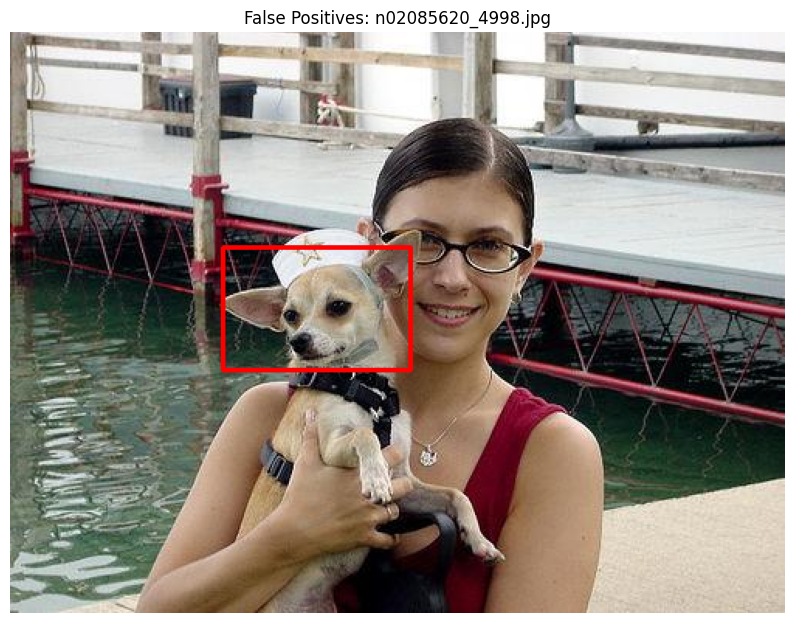

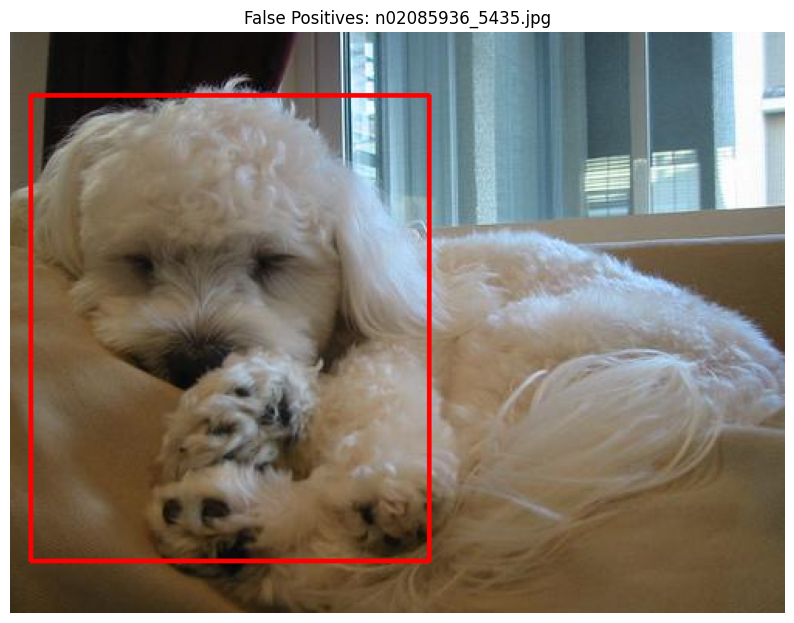

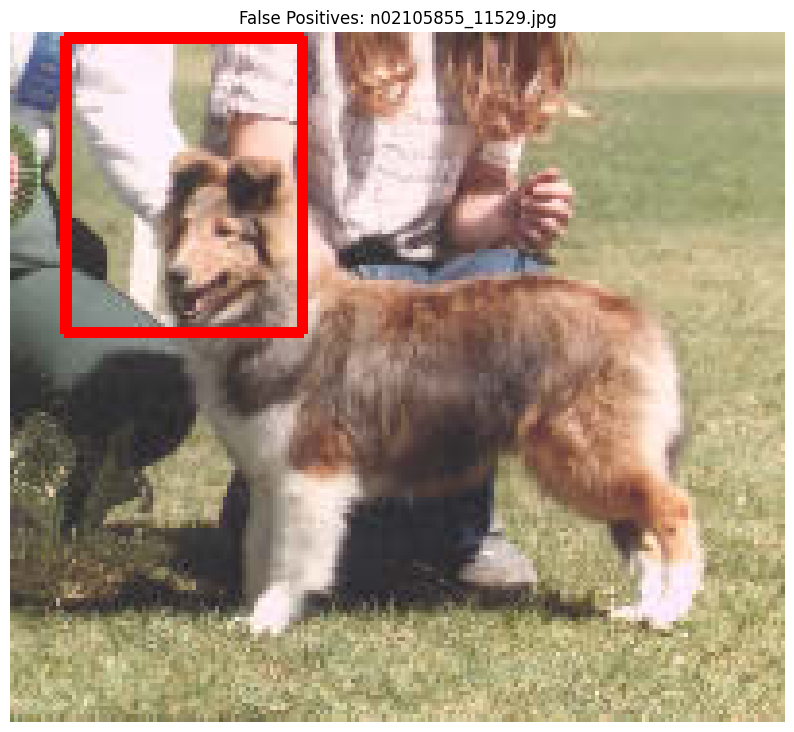

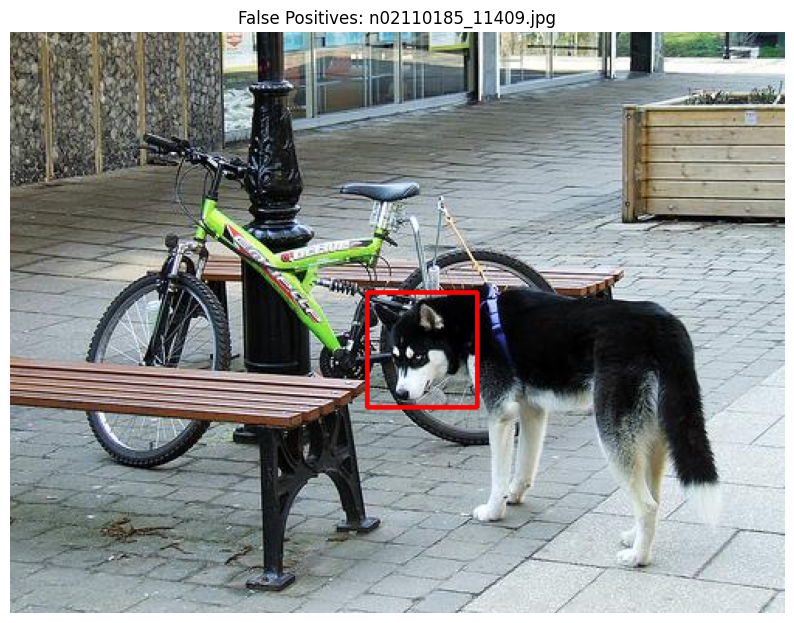

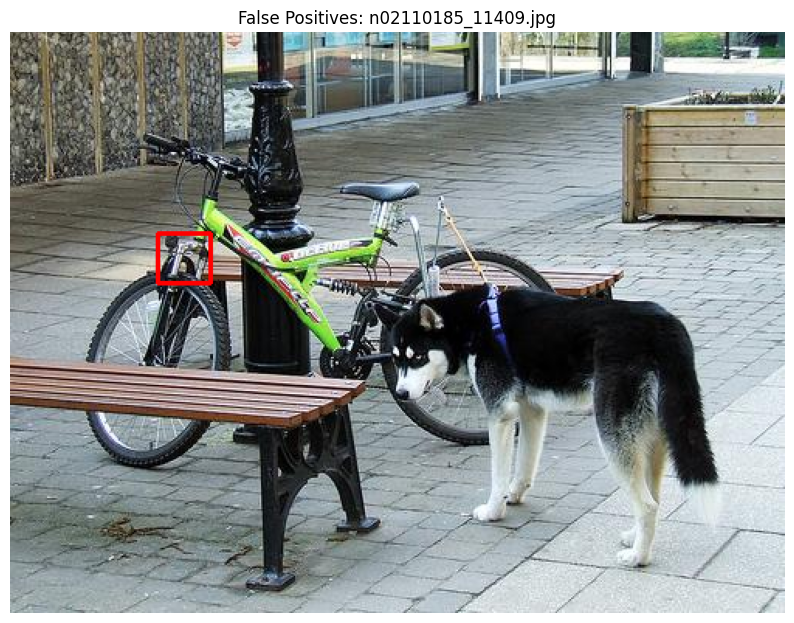

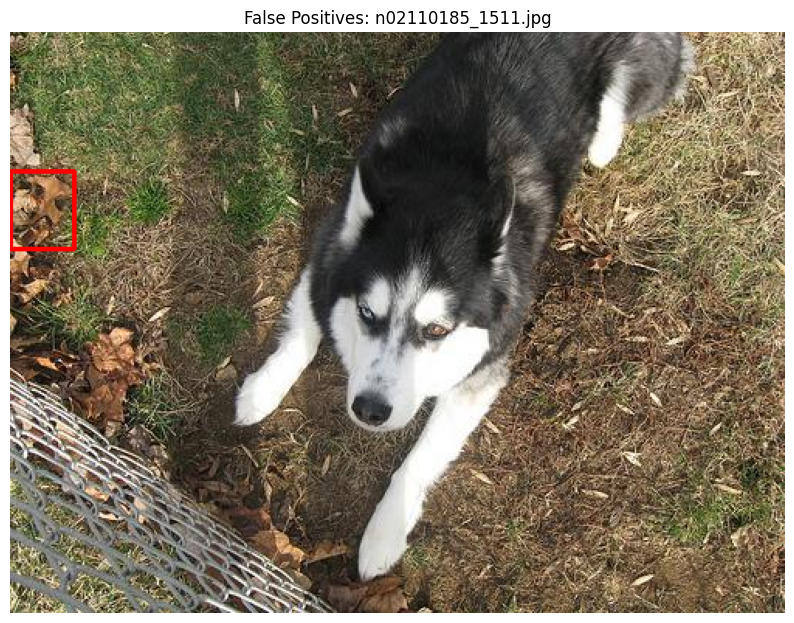

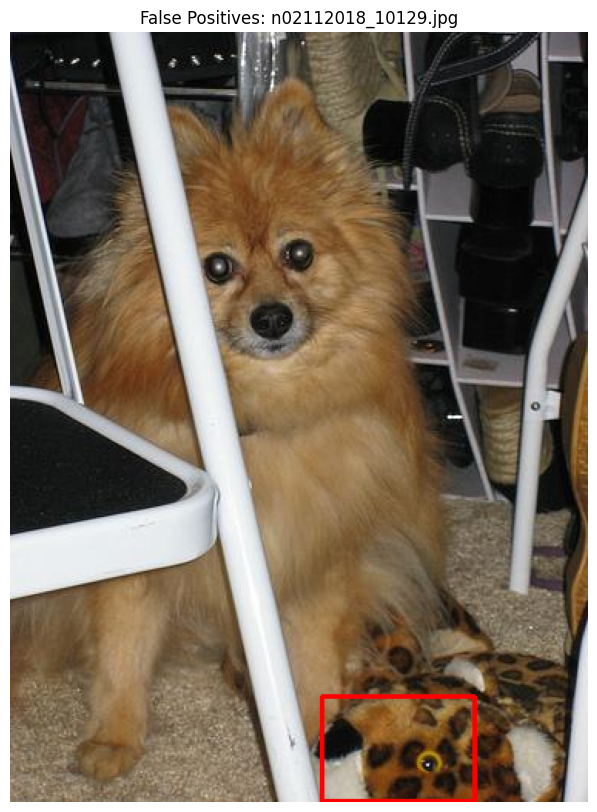

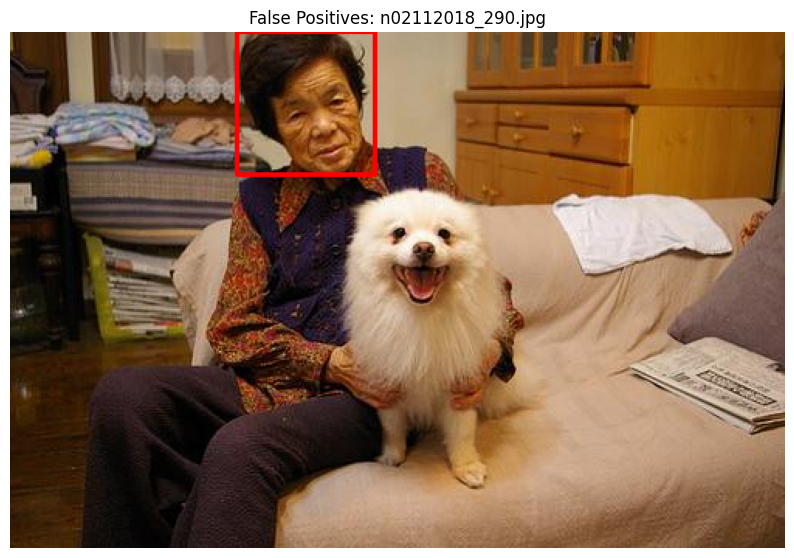

In [29]:
num_false_positives = 8

# Select the first 'num_false_positives' false positives
fp_images_to_show = false_positives_images[:num_false_positives]
fp_boxes_to_show = false_positives_boxes[:num_false_positives]

# Visualize the false positives using the previously defined function
visualize_errors(
    image_paths=fp_images_to_show,
    boxes_list=fp_boxes_to_show,
    error_type='False Positives'
)

### 10.5. Visualizing False Negatives

To further analyze the model's performance, we will visualize some of the false negatives. This helps us understand the instances where the model failed to detect a dog face when one was present in the image.

#### Displaying the First 5 False Negatives

We will use the `visualize_errors` function defined earlier to display the first few false negatives.

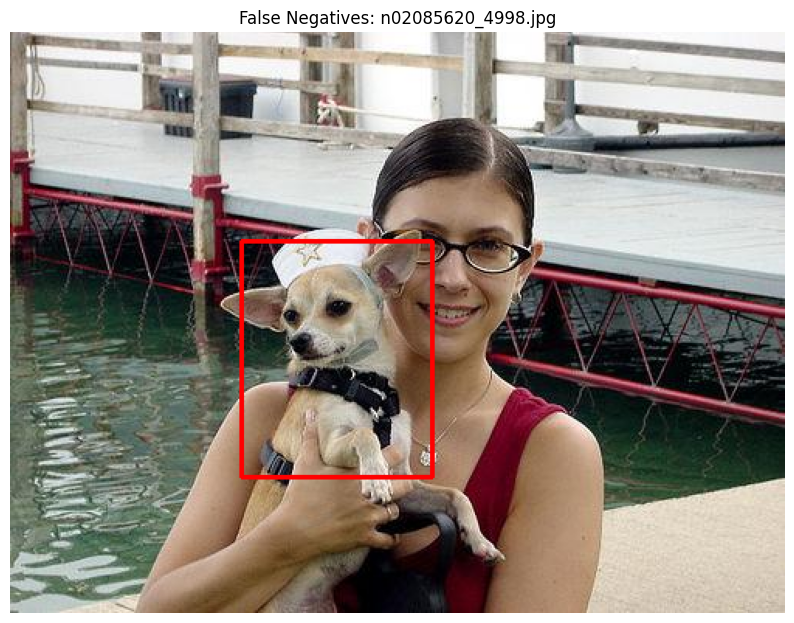

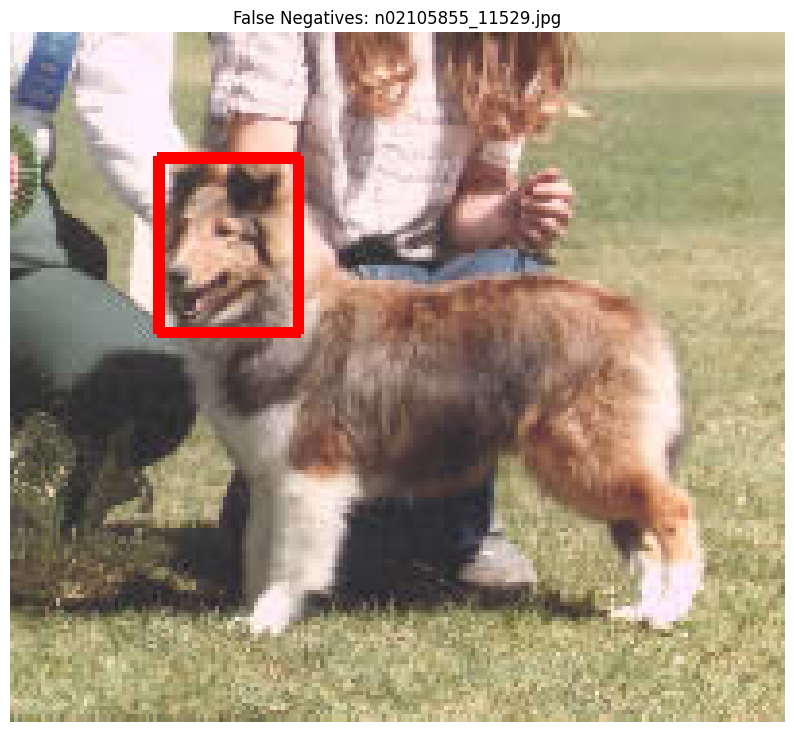

In [27]:
# Number of false negatives to display
num_false_negatives = 5

# Select the first 'num_false_negatives' false negatives
fn_images_to_show = false_negatives_images[:num_false_negatives]
fn_boxes_to_show = false_negatives_boxes[:num_false_negatives]

# Visualize the false negatives using the previously defined function
visualize_errors(
    image_paths=fn_images_to_show,
    boxes_list=fn_boxes_to_show,
    error_type='False Negatives'
)

### 10.6. Summary of Errors

After analyzing the model's predictions, we summarize the total number of images evaluated, as well as the counts of false positives and false negatives. This summary provides a quantitative measure of the model's performance and helps identify areas for improvement.

In [28]:
# Calculate the total number of images evaluated
total_images = len(pred_label_files)

# Calculate the total number of false positives and false negatives
total_fp = len(false_positives_images)
total_fn = len(false_negatives_images)

# Print the summary of errors
print(f"Total images evaluated: {total_images}")
print(f"Total False Positives: {total_fp}")
print(f"Total False Negatives: {total_fn}")

Total images evaluated: 230
Total False Positives: 8
Total False Negatives: 2
